# A molecular map of lung neuroendocrine neoplasms

# Introduction

In a study published in Nature Communications in 2019 ([Alcala ](https://www.nature.com/articles/s41467-019-11276-9)*[et al.](https://www.nature.com/articles/s41467-019-11276-9)*[ Nat Commun 2019](https://www.nature.com/articles/s41467-019-11276-9)), we performed a molecular characterization of the rare understudied lung neuroendocrine neoplasms (lung NENs) that allowed us to identify clinically relevant molecular groups. To complement this study, we also published a data note in GigaScience ([Gabriel et al. GigaScience 2020](https://academic.oup.com/gigascience/article/9/11/giaa112/5943495), see also associated [GigaDB associated page](http://dx.doi.org/10.5524/100781)) where we firstly describe the preprocessing and the quality control steps performed on data generated by Alcala *et al.* and propose the first molecular map of lung NENs (pan-LNEN map) using the Uniform Manifold Approximation and Projection (UMAP) on RNA-sequencing data.  This map integrates homogenized data from multiple molecular studies on lung NENs ([Peifer ](https://www.nature.com/articles/ng.2396)*[et al.](https://www.nature.com/articles/ng.2396)*[ Nat Genet 2012](https://www.nature.com/articles/ng.2396); [Fernandez-Cuesta](https://www.nature.com/articles/ncomms4518) *[et al.](https://www.nature.com/articles/ncomms4518)* [Nat Commun 2014](https://www.nature.com/articles/ncomms4518); [George ](https://www.nature.com/articles/nature14664)*[et al.](https://www.nature.com/articles/nature14664)*[ Natu](https://www.nature.com/articles/nature14664)[re 2015](https://www.ncbi.nlm.nih.gov/pubmed/26168399); [George ](https://www.nature.com/articles/s41467-018-03099-x)*[et al.](https://www.nature.com/articles/s41467-018-03099-x)*[ Nat Commun 2018](https://www.nature.com/articles/s41467-018-03099-x); [Alcala ](https://www.nature.com/articles/s41467-019-11276-9)*[et al.](https://www.nature.com/articles/s41467-019-11276-9)*[ Nat Commun 2019](https://www.nature.com/articles/s41467-019-11276-9), [Laddha ](https://cancerres.aacrjournals.org/content/79/17/4339)*[et al.](https://cancerres.aacrjournals.org/content/79/17/4339)* [Cancer research 2019](https://cancerres.aacrjournals.org/content/79/17/4339)) with the aim of increasing the sample size to better understand this rare disease. The map was published on the [TumorMap interactive portal](https://tumormap.ucsc.edu/?p=RCG_lungNENomics/LNEN). 

This notebook complements the data note by providing the code necessary to reproduce the pan-LNEN molecular map. We also propose to assess the quality of the molecular map by: i) validating the biological hypotheses proposed in the previous studies, ii) exploring the preservation of the samples' neighborhood in the map, and iii) validating the preservation of spatial auto-correlations in the map.

# Setup

This section allows to set up the working environment, install the R packages, and upload the scripts and data sets needed for the analyses.

## R packages installation

Install CRAN packages

In [ ]:
install.packages(c("ade4",      # Principal Component Analysis
                   "umap",      # Uniform manifold analysis projection
                   "FNN",       # K-Neirest Neighbours
                   "ape",       # for Moran index
                   "reshape2",  # Basic tools
                   "ggpubr",    # Layout
                   "gridExtra", # Layout
                   "eulerr",    # Layout for UMAP
                   "viridis",   # Layout
                   "foreach",   # Parallel computing
                   "doParallel" # Parallel computing
                  ))

also installing the dependencies ‘matrixStats’, ‘zip’, ‘SparseM’, ‘MatrixModels’, ‘conquer’, ‘foreign’, ‘openxlsx’, ‘boot’, ‘minqa’, ‘nloptr’, ‘statmod’, ‘carData’, ‘abind’, ‘pbkrtest’, ‘quantreg’, ‘maptools’, ‘rio’, ‘lme4’, ‘rappdirs’, ‘RcppEigen’, ‘corrplot’, ‘car’, ‘pixmap’, ‘sp’, ‘reticulate’, ‘RSpectra’, ‘ggrepel’, ‘ggsci’, ‘cowplot’, ‘ggsignif’, ‘polynom’, ‘rstatix’, ‘GenSA’, ‘polyclip’, ‘polylabelr’


Warning message in install.packages(c("ade4", "umap", "FNN", "ape", "reshape2", :
“installation of package ‘matrixStats’ had non-zero exit status”
Warning message in install.packages(c("ade4", "umap", "FNN", "ape", "reshape2", :
“installation of package ‘zip’ had non-zero exit status”
Warning message in install.packages(c("ade4", "umap", "FNN", "ape", "reshape2", :
“installation of package ‘SparseM’ had non-zero exit status”


Install Bioconductor packages

In [1]:
install.packages("BiocManager")
BiocManager::install("DESeq2")

## R packages loading

In [1]:
library(umap) 
library(ade4)
library(FNN)
library(reshape2)
library(ape)
library(ggpubr)
library(foreach)
library(doParallel)
library(gridExtra)
library(eulerr)
library(viridis)
library(DESeq2)
library(RColorBrewer)

sessionInfo()

In [1]:
%%sh
ls

Note that to avoid running the notebook entirely, the R environment allowing to generate all the results included in the notebook has been saved in the file `R_environment.Rdata` and can be loaded by uncommenting the following line.

In [1]:
#load('R_environment.Rdata')

## Scripts and data loading

The scripts used to perform and evaluate the dimensionality reduction of the pan-LNEN RNA-seq data are available in the following GitHub repository: 

The DRMetrics repository contains (see [readme](https://github.com/IARCbioinfo/DRMetrics) for additional details):

* A folder named **"scripts"** containing the R scripts enabling the assessment of the quality of low-dimensional representations
* A folder named **"data"** containing the data required to reproduce the results presented in the GigaScience paper:
  * *read_counts_all.txt.zip*: homogenized gene expression quantification from RNA-seq data from several published manuscripts ([Peifer ](https://www.nature.com/articles/ng.2396)*[et al.](https://www.nature.com/articles/ng.2396)*[ Nat Genet 2012](https://www.nature.com/articles/ng.2396); [Fernandez-Cuesta](https://www.nature.com/articles/ncomms4518) *[et al.](https://www.nature.com/articles/ncomms4518)* [Nat Commun 2014](https://www.nature.com/articles/ncomms4518); [George ](https://www.nature.com/articles/nature14664)*[et al.](https://www.nature.com/articles/nature14664)*[ Nature 201](https://www.nature.com/articles/nature14664)[5](https://www.ncbi.nlm.nih.gov/pubmed/26168399); [George ](https://www.nature.com/articles/s41467-018-03099-x)*[et al.](https://www.nature.com/articles/s41467-018-03099-x)*[ Nat Commun 2018](https://www.nature.com/articles/s41467-018-03099-x); [Alcala ](https://www.nature.com/articles/s41467-019-11276-9)*[et al.](https://www.nature.com/articles/s41467-019-11276-9)*[ Nat Commun 2019](https://www.nature.com/articles/s41467-019-11276-9), [Laddha ](https://cancerres.aacrjournals.org/content/79/17/4339)*[et al.](https://cancerres.aacrjournals.org/content/79/17/4339)* [2019](https://cancerres.aacrjournals.org/content/79/17/4339)). The data are stored as a matrix of raw read counts of 59,607 genes (rows) from the 239 samples (columns, including 1 technical replicate).
  * *Attributes.txt.zip*: main clinical features and the relevant genes (columns) for the 238 unique individuals (rows) reported in the previous manuscripts. 
  * *Coords_umap_nn238.txt.zip*: UMAP coordinates (columns) associated with the map shared on the [TumorMap interactive portal](https://tumormap.ucsc.edu/?bookmark=fca89cbb17d89dd13cbfdefbc6a3d207d70f0cfcc836c13a1037bcccda383c08), for each of 238 unique individuals (rows).
  * [ref_annot.gtf.gene_spans.zip](https://github.com/IARCbioinfo/DRMetrics/blob/NextJournalH/data/ref_annot.gtf.gene_spans.zip): genome annotation associated to the GRCh38 human reference genome, version 33, from bundle [CTAT from the 6th of April 2020](https://data.broadinstitute.org/Trinity/CTAT_RESOURCE_LIB/) 
  * [hg38_Gencode_V33.bed.zip](https://github.com/IARCbioinfo/DRMetrics/blob/NextJournalH/data/hg38_Gencode_V33.bed.zip) and [hg38_Gencode_V33_merged.bed.zip](https://github.com/IARCbioinfo/DRMetrics/blob/NextJournalH/data/hg38_Gencode_V33_merged.bed.zip): bed files used in the RNA-Seq data preprocessing (see below)

**Loading the main functions needed to perform the analyses:**

In [1]:
source("/DRMetrics/scripts/DR_quality_metrics.r")

**Loading the RNA-Seq and clinical data:**  

The raw RNA-seq fastq files were preprocessed following four nextflow pipelines available in the [IARCbioinfo ](https://github.com/IARCbioinfo/)GitHub repository. Note that the pipelines were run using singularity but docker and conda profiles could also be used.

**Step 1:**  we performed RNA sequencing mapping and quality controls using the pipeline [IARCbioinfo/RNAseq-nf](https://github.com/IARCbioinfo/RNAseq-nf/releases/tag/v2.3/) by running the following command:

`nextflow run iarcbioinfo/RNAseq-nf -r v2.3 -profile singularity --input_folder folder_with_fastq_files --output_folder out_RNAseq-nf-2.3 --ref_folder ref_genome.fa.star.idx/ --ref ref_genome.fa --gtf ref_annot.gtf --bed hg38_Gencode_v33.bed --fastq_ext fastq --STAR_mapqUnique 60 --cutadapt  `

Where `folder_with_fastq_files` is a folder containing all the fastq files, `ref_genome.fa.star.idx` is a folder with the genome reference files for software STAR, `ref_annot.gtf` the annotation file and `hg38_Gencode_v33.bed` a bed file with list of intervals for further annotations by [RSeQC](http://rseqc.sourceforge.net). The bed file was generated using the [UCSC table browser](https://genome.ucsc.edu/cgi-bin/hgTables?clade=mammal&org=Human&db=hg38&hgta_group=genes&hgta_track=wgEncodeGencodeV33&hgta_table=0&hgta_regionType=genome&hgta_outputType=bed&hgta_outFileName=hg38_Gencode_V33.bed) and the genome reference files, the annotation file should be associated to the GRCh38 human reference genome, version 33, from bundle [CTAT from the 6th of April 2020](https://data.broadinstitute.org/Trinity/CTAT_RESOURCE_LIB/) (located in the folder `GRCh38_gencode_v33_CTAT_lib_Apr062020.plug-n-play/ctat_genome_lib_build_dir/`).

**Step 2:** we refined alignments of the BAM files using the pipeline [IARCbioinfo/abra-nf](https://github.com/IARCbioinfo/abra-nf/releases/tag/v3.0) by running the following command:

`nextflow run iarcbioinfo/abra-nf -r v3.0 -profile singularity --bam_folder out_RNAseq-nf-2.3/BAM --output_folder out_abra-nf-3.0 --ref ref_genome.fa --gtf ref_annot.gtf --bed hg38_Gencode_v33_merged.bed --junctions --rna`

The BAM files used as input for ABRA are the outputs of the first alignment step. The reference and annotation files used are the same as the ones used in step 1 with an exception for the bed file which has been modified so that no overlapping intervals remain using [bedtools](https://bedtools.readthedocs.io/en/latest/): 

`sort -k1,1 -k2,2n hg38_Gencode_v33.bed | bedtools merge -i stdin > hg38_Gencode_v33_merged.bed`

**Step 3:** we performed base quality score recalibration using the pipeline [IARCbioinfo/BQSR-nf](https://github.com/IARCbioinfo/BQSR-nf/releases/tag/v1.1) by running the following command:

`nextflow run iarcbioinfo/BQSR-nf -r v1.1 -profile singularity --input_folder out_abra-nf-3.0/ --ref ref_genome.fa --snp_vcf dbsnp_146.hg38.vcf.gz --indel_vcf Mills_and_1000G_gold_standard.indels.hg38.vcf.gz --output_folder out_bqsr-nf-1.1  `

Where the vcf files come from the [GATK bundle hg38](https://gatk.broadinstitute.org/hc/en-us/articles/360035890811-Resource-bundle).

**Step 4:** we performed gene expression quantification using the pipeline [IARCbioinfo/RNAseq-transcript-nf](https://github.com/IARCbioinfo/RNAseq-transcript-nf/releases/tag/v2.1) by running the following command:

`nextflow run iarcbioinfo/RNAseq-transcript-nf -r v2.1 -profile singularity --input_file input-transcript.txt` `--gtf ref_annot.gtf --output_folder out_RNAseq-transcript-nf-2.1 `

The file `input-transcript.txt` contains in rows, the samples ID, paths to BAM files, and read lengths per sample. The latter were computed using the post-trimming fastqc outputs of the first step by computing the average of the two fastq files read length values and rounding it.

For our analysis, we merged the samples raw read counts generated by the fourth step in a single matrix. In the following code cell, we load the read counts associated to all samples as well as the clinical data associated.

In [1]:
Attributes = read.table(unzip('DRMetrics/data/Attributes.txt.zip')[1], sep = '\t', header = T)
Attributes[1:5,1:10]
read_counts = as.matrix(read.table(unzip('DRMetrics/data/read_counts_all.txt.zip')[1], header = T, row.names=1))
read_counts[1:5,1:10]

We removed read counts associated with genes located on sex and mitochondrial chromosomes. After this filtering 56 597 remained.

In [1]:
# Read gene annotations 
genespans   = read.table(unzip('DRMetrics/data/ref_annot.gtf.gene_spans.zip')[1],stringsAsFactors = F)
dim(genespans)
rownames(genespans) = genespans[,1]

# Remove genes on sex and mitochondrial chromosomes 
genenames   = rownames(read_counts)
summary(genenames %in% rownames(genespans))
genes.sex   = genespans[genespans$V2 %in% c("chrM", "chrX", "chrY"), ]
genes.nosex = genespans[!(genespans$V2 %in% c("chrM", "chrX", "chrY")), ]

read_counts = read_counts[which(rownames(read_counts) %in% rownames(genes.nosex)), ]
dim(read_counts)


**Data pre-processing:**

The raw read counts needed to be normalized; we used the variance stabilizing transformation from the DESeq2 R package. 

In [1]:
colData = as.matrix(colnames(read_counts))
DESeq_object = DESeqDataSetFromMatrix(countData=read_counts,colData = colData,design = ~1)
VST = varianceStabilizingTransformation(DESeq_object)
VST = assay(VST)
dim(VST)
VST[1:5,1:5]

For each analysis, the most variable genes, explaining 50% of the total variance in variance-stabilized read counts, were selected (6,390 out of  the 56,597 initial genes).

In [1]:
rvdm     = apply(VST,1,var)
ntopdm   = rev(which( cumsum( sort(rvdm,decreasing = T) )/sum(rvdm) <= 0.5 ))[1]
selectdm = order(rvdm, decreasing = TRUE)[seq_len(ntopdm)]
vst50    = t(VST[selectdm,])
vst50[1:5,1:5]
dim(vst50)

We kept only one replicate per individual (the column Sample_ID in table Attributes, excluding sample S00716).

In [1]:
vst50 = vst50[as.character(Attributes$Sample_ID),]
dim(vst50)

# Dimensionality reduction

The analysis of the gene expression matrix is complex due to its high dimensionality. Dimensionality reduction methods are thus essential for hypothesis generation and interpretations. In this section, we present firstly the projections resulting from the principal component analysis (PCA) method and secondly a two-dimensional projection resulting from the Uniform Manifold Analysis Projection (UMAP) algorithm.

## Principal Component Analysis (PCA)

In the previously published datasets that we integrated, different molecular groups were identified: carcinoids A1, A2, and B (Alcala *et al.* Nat Commun 2019), and clusters LC1, LC2 and LC3 (Laddha *et al.* 2019)-that we found here corresponding respectively to carcinoids A1, B and A2 (see low dimensional projections below)-, LCNEC/TypeI and LCNEC/TypeII (George mun 2018), and SCLC (George *et al.* Nat Commun 2015). In order to distinguish the six molecular groups, we considered five principal components when evaluating the PCA results.

We used the *dudi.pca* function to perform a PCA on the lung NEN samples:

In [1]:
pca5D = dudi.pca(vst50, center = T , scale = T,  scannf = F , nf=5 )$li
head(pca5D)

However, to visualize the samples in the reduced space generated by the PCA , we needed to consider only two dimensions. The next code cell represents the lung NEN samples in several two dimensional spaces based on the different combination of the first five principal components.

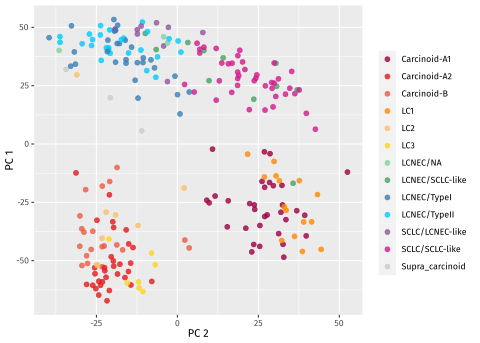

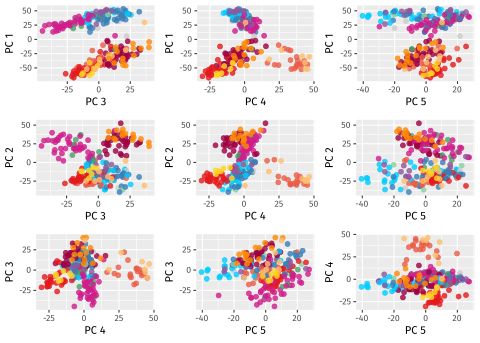

In [1]:
distinctive_cols <- c("#9E0142","#E41A1C","#E95D47","#FF8904","#FDBE6E","#FFD422","#88CFA4","#47A265","#397EB8","#00CCFF","#91569B","#D01C8B","#CCCCCC")

Axis_list = list(c(2,1), c(3,1), c(4,1), c(5,1), c(3,2), c(4,2), c(5,2), c(4,3), c(5,3), c(5,4))

plist <- list()
for(i in 1:length(Axis_list)){
  x_index = Axis_list[[i]][1]
  y_index = Axis_list[[i]][2]
  xlab   = paste("PC", x_index)
  ylab   = paste("PC", y_index)
  c_data = data.frame("axisX"=  pca5D[,x_index], "axisY" =pca5D[,y_index] )
  p      = ggplot(c_data, aes(x = axisX , y = axisY, color = Attributes$Molecular_clusters)) + geom_point(size=2, alpha=0.8) + scale_colour_manual(values=distinctive_cols) 
  
  if (x_index == 2 & y_index == 1){
    plist[[i]] = p + theme( legend.position="right", legend.title= element_blank()) + labs(x = xlab, y = ylab) 
  }else{
    plist[[i]] = p + theme( legend.position="none", legend.title= element_blank()) + labs(x = xlab, y = ylab) 
  }
}

ggarrange(plist[[1]])
grid.arrange(grobs = lapply(2:10, function(i){plist[[i]]}),  
             layout_matrix = rbind(c(2:4),c(5:7),c(8:10)), nrow =2)

## Uniform Manifold Analysis Projection (UMAP)

Another way to visualize data in a two dimensional space is to use UMAP. The UMAP algorithm is a non-linear dimensionality reduction technique based on topology. We applied UMAP to the RNA-seq pan-LNEN data using the *[umap](https://cran.r-project.org/web/packages/umap/index.html)* [R package](https://cran.r-project.org/web/packages/umap/index.html). Using this method we aimed at visualizing the molecular clusters identified in previous studies. UMAP doesn't necessarily preserve the global structure of the data and one important parameter for this is `n_neighbors`. Small and high values of `n_neighbors` favor the preservation of local structures and global structures, respectively. The pan-LNEN TumorMap was hence generated fixing the `n_neighbors` parameter to 238, which is the total number of samples. The other parameters were set to their default values. 

In [1]:
UMAP_TM = umap(vst50, n_neighbors = 238)$layout
colnames(UMAP_TM) = c("UMAP1","UMAP2")
UMAP_TM=as.data.frame(UMAP_TM)

Because UMAP is not deterministic, in order to reproduce the exact results presented in the GigaScience paper we upload in the following cell the UMAP coordinates used to create the pan-LNENs TumorMap (available in the [IARCbioinfo/DRMetrics](https://github.com/IARCbioinfo/DRMetrics) github repository):

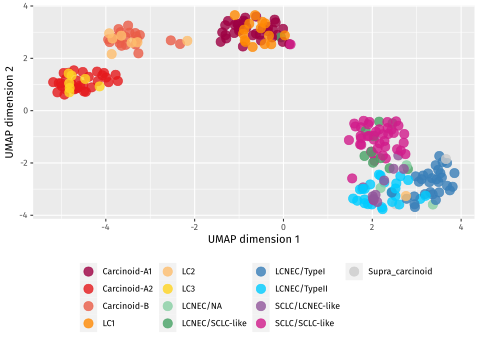

In [1]:
# Note that the next line replace the UMAP coordinates calculated in the previous cell with our pre-computed coordinates. You should comment it if you are running a customized analysis.
UMAP_TM = read.table(unzip('DRMetrics/data/Coords_umap_nn238.txt.zip')[1], sep = '\t', header = T, row.names=1)

UMAP_TM <- cbind(UMAP_TM, 'Molecular_clusters' = Attributes$Molecular_clusters)

ggplot(UMAP_TM, aes(x = UMAP1 , y = UMAP2, color = Molecular_clusters))+
geom_point(size=4, alpha=0.8)+ scale_colour_manual(values=distinctive_cols)+
labs(x = "UMAP dimension 1" , y = "UMAP dimension 2", color = "")+ theme(legend.position = "bottom")+
guides(col = guide_legend( nrow = 4)) 
head(UMAP_TM)

# Validation of biological hypotheses

Although non-linear dimensionality reduction methods such as UMAP lack interpretability in comparison to PCA, we attempted to show that this simple layout captures the main biological findings highlighted in the previous studies (Fernandez-Cuesta et al. Nat Commun 2014; George et al. Nature 2015; George et al. Nat Commun 2019; Alcala et al. Nat Commun 2019; Laddha *et al.* Cancer research 2019). 

In previous studies, some subgroups of lung NENs have been identified as having the molecular features of a histopathological type that is different from their initial histopathological classification. We checked whether our tumor map captures this phenomenon by comparing the distances from these discordant tumors to their molecular and histopathological groups, respectively. The following code chunk corresponds to the code used to perform these comparisons using a one-sided Wilcoxon's test.

In [1]:
clusters_distances_F <- function(Coords, evals, ref1, ref2, alt_hyp){
  # Coords: a data frame with the following columns: i) the samples coordinates on the dimensionality reduction axes, and ii) the molecular cluster associated to each sample
  # evals: the molecular cluster to analyse 
  # ref1: the supposed molecular cluster(s)
  # ref2: the supposed histopathological group(s)
  # alt_hyp: the alternative hypothesis for the wilcoxon test 
  Coords_evals = Coords[Coords$Molecular_clusters==evals,]
  T1           = Coords[which(Coords$Molecular_clusters %in% ref1),] 
  T1_centroid  = colMeans(T1[,1:2])
  dist_1       = sqrt( (Coords_evals[,1] - T1_centroid[1])^2 + ( Coords_evals[,2] - T1_centroid [2])^2 )
  T2           = Coords[which(Coords$Molecular_clusters %in% ref2),]
  T2_centroid  = colMeans(T2[,1:2])
  dist_2       = sqrt( (Coords_evals[,1] - T2_centroid[1])^2 + ( Coords_evals[,2] - T2_centroid [2])^2 )
  return(wilcox.test(dist_1 , dist_2, alt_hyp)$p.value) 
}

As an example, we can consider the LCNEC/SCLC-like samples identified by George *et al.* in 2019 as being LCNEC samples that have the molecular profile of the SCLC samples. Using the function above, we showed that in the pan-LNEN TumorMap, these LCNEC/SCLC-like samples were indeed significantly closer to the SCLC samples than the LCNEC samples:

In [1]:
wilcoxon_res = clusters_distances_F(UMAP_TM, "LCNEC/SCLC-like","SCLC/SCLC-like",c("LCNEC/TypeI", "LCNEC/TypeII"), 'less')
paste('Wilcoxon p-value = ', format(wilcoxon_res, digits = 2))

# Quality controls of the dimensionality reduction

## Structural consistency of projections

We evaluated the preservation of the samples' neighborhood using the sequence difference view (SD) dissimilarity metric proposed by [Martins ](https://bdpi.usp.br/bitstream/handle/BDPI/49441/2722542.pdf;sequence=1)*[et al.](https://bdpi.usp.br/bitstream/handle/BDPI/49441/2722542.pdf;sequence=1)* in 2015. This measure compares samples' neighborhoods in two different spaces, $$$\small
D_1$ and $\small
D_2$. In our case, $\small
D_1$ will typically be the original high-dimensional space and $\small
D_2$ the reduced space from UMAP. The SD metric of sample *i* is defined as follows:

$$
\scriptsize
\begin{align}
 SD_k(i) = \frac{1}{2} \sum_{j \in V^1_k(i)}[k-\rho^1_i(j)].|\rho^1_i(j)-\rho^2_i(j)|+ \frac{1}{2} \sum_{j \in V^2_k(i)}[k-\rho^2_i(j)].|\rho^1_i(j)-\rho^2_i(j)|
\end{align}
$$
Parameter $\small
k$ corresponds to the number of nearest neighbors to consider for the computation of the neighborhood of sample $\small
i$; $\small
V^1_k(i)$ and $\small
V^2_k(i)$ denote the neighborhoods in $\small
D_1$ and $\small
D_2$, respectively. $\small
\rho^1_i(j)$ and $\small
\rho^2_i(j)$ are the ranks of the distance between sample *i* and the $\small
j_{th}$ neighbor of sample $\small
i$ in the two spaces, respectively (ranked from 0 to *k*-1). 

The SD metric firstly evaluates, for each point, its ranking in the two neighborhoods ($\small
\rho^1_i(j)$ and $\small
\rho^2_i(j)$). Secondly, it penalizes discordant rankings (terms |$\small
\rho^1_i(j)$ - $\small
\rho^2_i(j)$|), the penalty being larger if the discordance is observed for close neighbors (terms |*k*-$\small
\rho^1_i(j)$| and |*k*-$\small
\rho^2_i(j)$|). As a result, SD is non-negative, with high SD values indicating a poor preservation of the neighborhood while values close to 0 indicate a near-perfect preservation of the neighborhood.

### Individual evaluation of samples' neighborhood

The following code chunk uses the `compute_SD` function to compute the SD values associated to each sample for different values of $\small
k$. In the following example, we used the SD metric to compare the UMAP layout with the five-dimensional space resulting from the PCA (PCA-5D).

In [1]:
distpca5D = as.matrix(dist(pca5D, method = "euclidean", diag = TRUE, upper = TRUE))
distpca5D[1:5,1:5]

k_values = seq(2,238,5)
SD_pca5D = compute_SD_allSamples(distRef = distpca5D, List_projection = list("UMAP_TM" = UMAP_TM[,1:2]), k_values = k_values,colnames_res_df = "UMAP-nn238")
head(SD_pca5D)

The `SD_map_f` function is then called to represent the lung NEN samples in the UMAP projection and show, with a color gradient, the SD values averaged over the $k$ values.

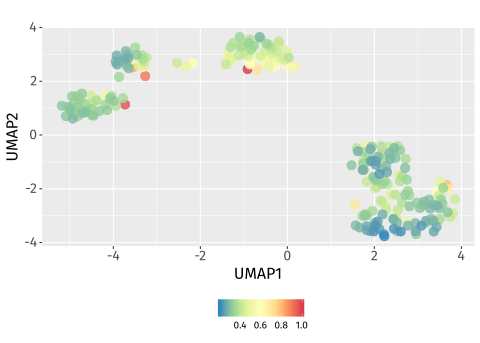

In [1]:
sd_map_lnen = SD_map_f(SD_pca5D , UMAP_TM, "bottom")
sd_map_res  = sd_map_lnen[[1]]
head(sd_map_res)
sd_map_lnen[[2]]

The above representation allows the identification of the samples with the lowest sample neighborhood preservation between UMAP and PCA-5D. We chose to explore the samples' neighborhood of S02340 which have the highest SD metric. This sample is an atypical sample that clusters with the Carcinoid-A1 cluster on the UMAP projection. To explain this high SD value, we computed the euclidean distances between each sample and S02340 in the two spaces.

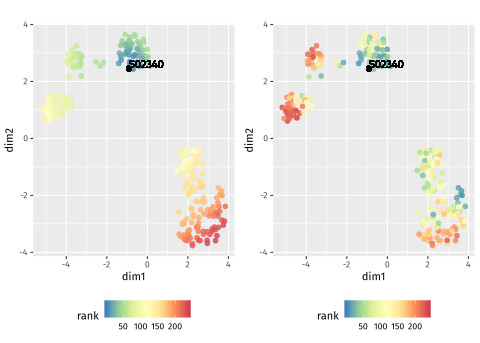

In [1]:
plot_dist <- function(coords,projection_coords,focal_sample){
  dist1 = as.matrix(dist(coords[, 1:(ncol(coords)-1)], method = "euclidian", diag = TRUE, upper = TRUE))
  Sample_names = rownames(coords)
  dist1        = data.frame("Sample_ID" = rownames(dist1)[order(dist1[,focal_sample])], "rank" = 1:length(rownames(dist1)) )
  merged_df    = merge(cbind(Sample_ID = rownames(projection_coords), projection_coords), dist1,  by= "Sample_ID")
  colnames(merged_df)[2:3] = c("V1","V2")
  
  proj_dist    = ggplot(merged_df, aes(x=V1, y=V2,  color=rank, label=merged_df$Sample_ID)) +
  geom_point(size=2, alpha =.8) + scale_color_distiller(palette = "Spectral") +
  geom_point(aes(merged_df$V1[which(merged_df$Sample_ID == focal_sample)],
                 merged_df$V2[which(merged_df$Sample_ID == focal_sample)] ),
             size=2, col = "black") +
  geom_text(aes(merged_df$V1[ merged_df$Sample_ID== focal_sample],
                merged_df$V2[ merged_df$Sample_ID== focal_sample],
                label=merged_df$Sample_ID[merged_df$Sample_ID==focal_sample]),
            col = 'black' , hjust=0, vjust=0 ) +
  labs(title="", y="dim2", x="dim1") + theme( legend.position = "bottom")
	return(proj_dist)
}

p1 <- plot_dist(UMAP_TM,UMAP_TM,"S02340")
p2 <- plot_dist(pca5D,UMAP_TM,"S02340")
grid.arrange(grobs = list(p1,p2), layout_matrix = rbind(c(1,2)), nrow =1)


In the above figure, the left and right panels represent the UMAP projection of lung NEN samples, with a color gradient corresponding to the rank of each sample in the neighborhoods of S02340 in UMAP and PCA-5D projections, respectively. In the UMAP projection (left panel), the nearest neighbors of S02340 belong to the carcinoids cluster (top cluster). However, in the PCA projection (right panel) S02340 is also close to LCNEC samples, more specifically the LCNEC Type I samples (bottom cluster), suggesting that the UMAP projection for that sample might be misleading.

Exploring the SD metric for each sample allows us to identify samples with questionable projections.  

### Global preservation of samples' neighborhoods

Using the SD metric, we also evaluated the global preservation of the samples neighborhoods of different dimensionality reductions: i) PCA-5D: the projection based on the five first principal components of the PCA, ii) PCA-2D: the projection based on the two first principal components of the PCA, iii) projections generated by UMAP based on different values of the `n_neighbors` parameter (15 (default value), 30, 90, 180 and 238).  

In [1]:
n_neighborsL <- c(15,30,90,180,238)
List_projection <- list("pca2D" = pca5D[1:2], "pca5D" = pca5D) 
for (j in 1:length(n_neighborsL)){
  umap_c = umap(vst50, n_neighbors = n_neighborsL[j])$layout
  List_projection[[j+2]] <- umap_c
  names(List_projection)[j+2] <- paste("umap_nn", n_neighborsL[j])
}

We computed the SD metric for each sample and each projection while varying the parameter $k$ in order to explore the samples neighborhood preservation at different scales. We averaged the SD metric over the samples. Due to the stochastic nature of the UMAP optimization step, we repeated each UMAP run multiple times. The following code cell performs these iterations. To speed up the computation on Nextjournal, we fixed the number of iterations to 10 (`n_iter` parameter below) but this number can be increased by the user. In the GigaScience paper, `n_iter` was fixed to 1000 to generate Figure 4.

In [1]:
distRef = as.matrix(dist(vst50, method = "euclidean", diag = TRUE, upper = TRUE))
distRef[1:5,1:5]

k_values        = seq(2,238,25)
n_neighborsL    = c(15,30,90,180,238)
colnames_res_df = c('PCA-2D', 'PCA-5D',  paste0('UMAP-nn',n_neighborsL) )
n_iter          = 10
no_cores        = 2
                                                
cl = makeCluster(no_cores)
registerDoParallel(cl)

SD_means <-  foreach(i=1:n_iter, .packages = c("umap","doParallel"))%dopar%{
  List_projection = list("PCA-2D" = pca5D[,1:2], "PCA-5D" = pca5D) 
  for (j in 1:length(n_neighborsL)){
    List_projection[[j+2]] = umap(vst50, n_neighbors = n_neighborsL[j])$layout
    names(List_projection)[j+2] = paste("umap_nn", n_neighborsL[j])
  } 
  SD_comp = compute_SD_allSamples(distRef, List_projection, k_values, colnames_res_df)
  
  # For each k compute the mean value over all samples
  SD_k_mean = sapply(1:length(colnames_res_df), function(j) aggregate(SD_comp[,colnames_res_df[j]],list(SD_comp$K),mean)$x) 
  colnames(SD_k_mean) = colnames_res_df
  rownames(SD_k_mean) = k_values
  
  return(SD_k_mean)
}  
                     
stopCluster(cl)

For each of the 10 replicate iterations (elements of list SD_means), for each dimensionality reduction technique (columns), we computed the mean SD value across samples for different $\small k$ (rows):

In [1]:
#mean SD as function of k for the first iteration
head(SD_means[[1]])

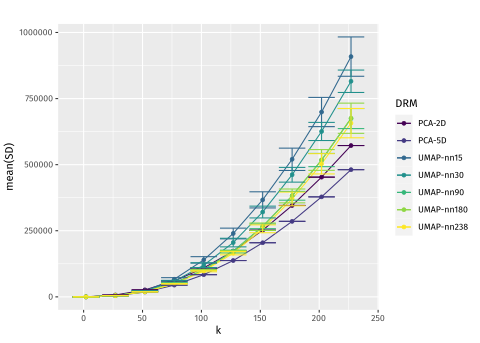

In [1]:
Mean_SD = melt( apply(simplify2array(SD_means), 1:2, mean), varnames = c("k","DRM"), value.name = "mean" )
sd_SD   = melt( apply(simplify2array(SD_means), 1:2, sd), varnames = c("k","DRM"), value.name = "sd" )
Main_SD_DF = cbind(Mean_SD, sd = sd_SD$sd)
head(Main_SD_DF)

p = ggplot(Main_SD_DF, aes(x =  k, y = mean, color = DRM)) +
  geom_line() +  geom_point()+
  scale_color_viridis(discrete=TRUE) +
  geom_errorbar(aes(ymin = mean-sd, ymax = mean+sd))+
  labs(title = "", y = "mean(SD)", x = "k") 
p

To facilitate the visualization and to compare the sample neighborhood preservation of the different projections, we normalized the mean SD values so that the SD of the PCA-2D is 1 and that of the PCA-5D is 0, as described in the GigaScience paper (equation 1).

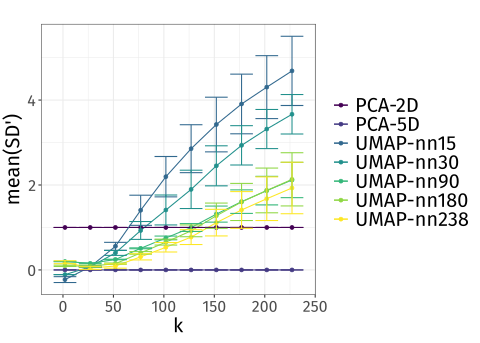

In [1]:
SD_means_norm = lapply( SD_means, function(x) (x[,2] - x)/(x[,2] - x[,1] ) )

Mean_SD_norm = melt( apply(simplify2array(SD_means_norm), 1:2, mean), varnames = c("k","DRM"), value.name = "mean" )
sd_SD_norm   = melt( apply(simplify2array(SD_means_norm), 1:2, sd), varnames = c("k","DRM"), value.name = "sd" )
Main_SD_norm_DF = cbind(Mean_SD_norm, sd = sd_SD_norm$sd)

theme_set(theme_bw())
ggplot(Main_SD_norm_DF, aes(x = k, y = mean, color = DRM)) +
  geom_line() + geom_point()+
  scale_color_viridis(discrete=TRUE) +
  geom_errorbar(aes(ymin = mean-sd, ymax = mean+sd))+
  labs(title = "", y = "mean(SD')", x = "k") +
  theme( axis.title.x=element_text(size=20),  # X axis title
         axis.title.y=element_text(size=20),  # Y axis title
         axis.text.x=element_text(size=16),  # X axis text
         axis.text.y=element_text(size=16),
         legend.text = element_text(size = 20) ,
         legend.title = element_blank())


The above figure shows that varying the `n_neighbors` parameter has an impact on the sample neighborhood preservation. While lower values of `n_neighbors` improve the preservation of the local sample neighborhood (low SD for small $k$ values), higher values of `n_neighbors` improve the global preservation of the neighborhood (low SD large $k$ values). Overall, `n_neighbors=238` is a good compromise between local and global preservation, having preservations at least as good as PCA-2D for most $k$ values but also having preservations almost as good as PCA-5D for local neighborhoods.

## Preservation of spatial autocorrelation

We can evaluate the spatial auto-correlation for focal genes using the Moran index. This metric ranges from -1 (inverse spatial autocorrelation) to 1 (perfect spatial autocorrelation). For a given gene, the index considers the similarity between the gene expression levels of samples in the $k$-neighborhood of each sample. The following code cell computes the Moran index values for all the genes and different values of $k$ for: i) the original space, ii) PCA-5D, and iii) UMAP-nn238. The means of Moran index values for all k levels are then calculated. 

In [1]:
n_genes = ncol(vst50)
k_step  = seq(2,238,25)

MI_GeneExprMat = moran_I_knn(vst50[,1:n_genes], vst50,k_step)
MI_UMAP        = moran_I_knn(vst50[,1:n_genes], UMAP_TM[,1:2],k_step)
MI_PCA5D       = moran_I_knn(vst50[,1:n_genes], pca5D,k_step)

head(MI_UMAP)

We computed first the average of the Moran's indexes over $k$ values for each gene and then the overlap between the greatest averaged Moran indexes with respect to the different spaces:

In [1]:
MI_PCA5D_order       = order(colMeans(MI_PCA5D[,1,]), decreasing=T) 
MI_UMAP_order        = order(colMeans(MI_UMAP[,1,]), decreasing=T) 
MI_GeneExprMat_order = order(colMeans(MI_GeneExprMat[,1,]), decreasing=T) 

PCA5D_GeneExprMat_overlap = sapply(1:n_genes, function(i) mean( MI_PCA5D_order[1:i] %in% MI_GeneExprMat_order[1:i] ) )
PCA5D_UMAP_overlap        = sapply(1:n_genes, function(i) mean( MI_PCA5D_order[1:i] %in% MI_UMAP_order[1:i] ) )
UMAP_GeneExprMat_overlap  = sapply(1:n_genes, function(i) mean( MI_UMAP_order[1:i] %in% MI_GeneExprMat_order[1:i] ) )
PCA5D_UMAP_GeneExprMat_overlap = sapply(1:n_genes, function(i) mean( MI_PCA5D_order[1:i] %in% MI_GeneExprMat_order[1:i] & MI_PCA5D_order[1:i] %in% MI_UMAP_order[1:i] ) )

Expected = sapply(1:n_genes, function(i) (i/n_genes) )

cols <- c("Expected" =  "#FDE725FF", "PCA 5D - GeneExprMat" = "#440154FF","PCA 5D - UMAP 238 - GeneExprMat" = "#5DC863FF",  "PCA 5D - UMAP 238" = "#21908CFF", "UMAP 238 - GeneExprMat" = "#3B528BFF")

ggplot()+
geom_point(aes(x=seq(1:n_genes), y=PCA5D_GeneExprMat_overlap , colour="PCA 5D - GeneExprMat"), size = 0.1)+
geom_point(aes(seq(1:n_genes),  y=UMAP_GeneExprMat_overlap, colour="UMAP 238 - GeneExprMat"), size = 0.1)+
geom_point(aes(seq(1:n_genes),  y=PCA5D_UMAP_overlap , colour="PCA 5D - UMAP 238"), size = 0.1)+
geom_point(aes(seq(1:n_genes),  y=PCA5D_UMAP_GeneExprMat_overlap, colour="PCA 5D - UMAP 238 - GeneExprMat"), size = 0.1)+
labs(title="", y="Overlapping %", x="N", caption = "") +
scale_colour_manual(values=cols, labels =c("Expected", "PCA 5D - GeneExprMat","PCA 5D - UMAP 238 - GeneExprMat",  "PCA 5D - UMAP 238", "UMAP 238 - GeneExprMat")) +
theme( legend.position =  "bottom")+
geom_line(aes(seq(1:n_genes),  y=Expected, colour="Expected"), size = 1)+
geom_vline(xintercept = 1000, linetype="dashed")


We finally represented the Euler diagram of the gene sets corresponding to the top 1000 Moran indexes:

In [1]:
n_genes_sel = 1000
abc = PCA5D_UMAP_GeneExprMat_overlap[n_genes_sel]*n_genes_sel
ab  = PCA5D_UMAP_overlap[n_genes_sel]*n_genes_sel
ac  = PCA5D_GeneExprMat_overlap[n_genes_sel]*n_genes_sel
bc  = UMAP_GeneExprMat_overlap[n_genes_sel]*n_genes_sel

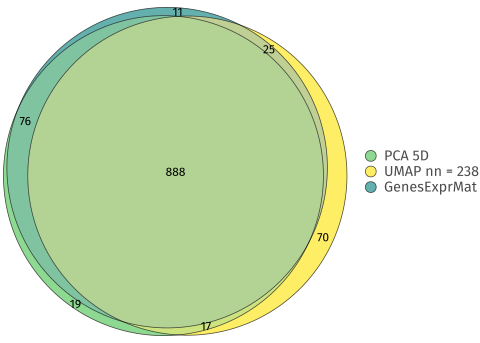

In [1]:
Venn <- c(c("A" = n_genes_sel - ((ab -abc) + abc + (ac -abc)) ,
           "B"  = n_genes_sel - ((ab -abc) + abc + (bc -abc)),
           "C"  = n_genes_sel - ((ac -abc) + abc + (bc -abc)),
           "A&B" = ab -abc,
           "A&C" = ac -abc,
           "B&C" = bc -abc ,
           "A&B&C" = abc))
PlotEuler <- plot(euler(Venn), fills = c("#5DC863FF", "#FDE725FF", "#21908CFF"),  quantities = list(cex = 1), alpha= .7, cex = 2, legend = list(labels = c("PCA 5D", "UMAP nn = 238", "GenesExprMat"), alpha=.7 ,cex =1.2))

PlotEuler 

The Euler diagram above represents the overlap between the top 1000 genes in the three lists and shows that 88.8% of the genes are in common. This result shows that the UMAP projection preserves genes spatial auto-correlation.

In [1]:
save.image('R_environment.Rdata')